In [32]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import missingno

# Feature Engineering
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder, LabelEncoder, OrdinalEncoder
from sklearn.compose import ColumnTransformer
import category_encoders as ce
from sklearn.preprocessing import RobustScaler, MinMaxScaler, StandardScaler


# resampler
from imblearn.under_sampling import RandomUnderSampler, NearMiss
from imblearn.over_sampling import RandomOverSampler, SMOTE

# Split Data & Validation
from sklearn.model_selection import train_test_split, KFold, cross_validate, cross_val_score

# Model Selection
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
import lightgbm as lgb
from sklearn.svm import SVC


# hyperparameter tuning
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV


# Metric Selection
from sklearn.metrics import f1_score, accuracy_score, recall_score, precision_score
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.metrics import classification_report, confusion_matrix


# Imbalance Dataset
from imblearn.pipeline import Pipeline


#import warning
import warnings
warnings.filterwarnings('ignore')

# BUSINESS PROBLEM UNDERSTANDING

### **CONTEXT**

- Perusahaan perhotelan kelas menengah, Hotel Portugal, di Portugal yang memiliki dua unit hotel di pusat kota dan di tepi pantai mencatatkan banyak sekali reservasi dari para calon penyewa hotel dari tahun 2015-2017. Namun di antara reservasi tersebut banyak yang berakhir batal. Hal ini mengisyaratkan perlunya dilakukan perbaikan sistem reservasi sehingga hotel mengetahui calon penyewa hotel mana yang benar-benar akan menginap dan mana yang membatalkannya, dilakukan untuk memaksimalkan pemesanan kamar demi mengantisipasi potensi hilangnya pendapatan pada saat musim ramai. Informasi-informasi terkait data diri dan detail pemesanan ada di tangan calon penyewa.

**STAKEHOLDER**

- Manajemen Operasional Hotel

**PROBLEM STATEMENT**

- Pada musim ramai seperti saat liburan musim panas, banyak sekali pengunjung yang akan pergi berlibur dan membutuhkan hotel untuk menginap. Hal ini membuat permintaan reservasi penuh pada saat-saat tertentu. Namun ada beberapa penyewa yang membatalkan reservasinya karena alasan-alasan tertentu. Hal ini akan berdampak pada pengurangan pendapatan pada hotel karena konsumen potensial (yang mungkin tidak batal) tak dapat membuat reservasi di tanggal yang diinginkan karena sistem menunjukkan bahwa kamar hotel telah penuh. Padahal bisa jadi pada akhirnya kamar tersebut bisa disewakan pemesan sebelumnya membatalkan reservasinya. Maka dari itu perusahaan meminta kelompok, sebagai data scientist, untuk mengelola model yang akan memprediksi batal/tidaknya sebuah reservasi yang kemudian dijadikan referensi pembatalan otomatis oleh sistem.

**GOALS**
- Dari permasalahan yang telah diuraikan diatas maka hotel berupaya untuk mengetahui calon pemesan mana yang akan berakhir check-in atau membatalkan reservasi sehingga dapat mengurangi jumlah pembatalan dan meningkatkan jumlah pengunjung yang benar-benar check-in. Setelah mengetahui calon penyewa mana saja yang akan membatalkan pemesanannya, pihak hotel dapat mengembangkan sistem pemberitahuan otomatis kepada pelanggan yang memiliki kecenderungan untuk membatalkan pemesanan. Memberi mereka opsi untuk melakukan DP atau mendapatkan penawaran khusus.  Hal ini bertujuan agar hotel dapat mengurangi risiko kerugian jika pemesanan tersebut akhirnya dibatalkan, dan pada saat yang sama, memberikan calon penyewa kesempatan untuk mempertimbangkan kembali keputusan mereka sebelum pembatalan. Dengan demikian, hotel dapat meningkatkan efisiensi dalam manajemen reservasi dan potensial meningkatkan pendapatan mereka.
- Selain itu pihak hotel juga ingin mengetahui karakteristik dari calon penyewa yang memiliki peluang besar untuk tidak membatalkan pemesanannya, sehingga hotel akan memaksimalkan operasional hotel mereka pada sektor tersebut.

**ANALYTICAL APPROACH**
- Langkah selanjutnya adalah mengumpulkan dan menganalisis data pemesanan untuk mengidentifikasi pola atau faktor-faktor yang berkontribusi pada pembatalan reservasi. 
- Kemudian kita akan membangun model klasifikasi yang akan membantu pihak management hotel untuk memprediksi probabilitas calon penyewa yang akan berakhir batal atau tidak.

- 1 : Calon penyewa yang berakhir cancel
- 0 : Calon penyewa yang berakhir check in

1. False Negatif: Model memprediksi calon pemesan tidak cancel dan sebenarnya cancel
    - Kerugian: Mengakibatkan kerugian finansial bagi hotel. Kamar yang sebenarnya dapat disewakan akan tetap kosong karena hotel menganggap pemesan akan check-in. Akibatnya, hotel kehilangan pendapatan yang dapat diperoleh dari kamar tersebut.
2. False Positive: Model memprediksi calon pemesan cancel dan sebenarnya tidak cancel
    - Kerugian: Mengakibatkan ketidaknyamanan bagi tamu. Mereka mungkin dihubungi oleh hotel atau diberitahu bahwa reservasi mereka telah dibatalkan, yang dapat menciptakan pengalaman yang tidak menyenangkan.

Dari permasalahan bisnis dan konsekuensi yang dijelaskan diatas, dapat disimpulkan bahwa lebih penting untuk meminimalkan False Negatives (FN). Ini dikarenakan kerugian yang mungkin terjadi akibat FN dapat lebih signifikan secara finansial dan berdampak pada pendapatan hotel.

**METRIC**

Dalam permasalahan bisnis Hotel Portugal, metrik yang sesuai adalah **recall**

Alasannya metrik ini memberikan lebih banyak bobot pada recall daripada presisi, sehingga lebih sensitif terhadap false negative. Dengan menggunakan **recall**, akan menekankan pentingnya mengidentifikasi calon penyewa yang akan membatalkan pemesanannya  secara akurat untuk menghindari kerugian bagi hotel.

# Dictionary

- hotel: Hotel (H1 = Resort Hotel or H2 = City Hotel)

- is_canceled: Value indicating if the booking was canceled (1) or not (0)

- lead_time: Number of days that elapsed between the entering date of the booking into the PMS and the arrival date

- arrival_date_year: Year of arrival date

- arrival_date_month: Month of arrival date
- arrival_date_week_number: Week number of year for arrival date
- arrival_date_day_of_month: Day of arrival date
- stays_in_weekend_nights: Number of weekend nights (Saturday or Sunday) the guest stayed or booked to stay at the hotel
- stays_in_week_nights: Number of week nights (Monday to Friday) the guest stayed or booked to stay at the hotel
- adults: Number of adults
- children: Number of children
- babies: Number of babies
- meal: Type of meal booked. Categories are presented in standard hospitality meal packages: Undefined/SC – no meal
- country: Country of origin. Categories are represented in the ISO 3155–3:2013 format
- market_segment: Market segment designation. In categories, the term “TA” means “Travel Agents” and “TO” means “Tour Operators”
- distribution_channel: Booking distribution channel. The term “TA” means “Travel Agents” and “TO” means “Tour Operators”
- is_repeated_guest: Value indicating if the booking name was from a repeated guest (1) or not (0)
- previous_cancellations: Number of previous bookings that were cancelled by the customer prior to the current booking
- previous_bookings_not_canceled: Number of previous bookings not cancelled by the customer prior to the current booking
- reserved_room_type: Code of room type reserved. Code is presented instead of designation for anonymity reasons.
- assigned_room_type: Code for the type of room assigned to the booking. Sometimes the assigned room type differs from the reserved room type due to hotel operation reasons (e.g. underbooking) or by customer request. Code is presented instead of designation for anonymity reasons.
- booking_changes: Number of changes/amendments made to the booking from the moment the booking was entered on the PMS until the moment of check-in or cancellation
- deposit_type: Indication on if the customer made a deposit to guarantee the booking. This variable can assume three categories: No Deposit – no deposit was made; Non Refund – a deposit was made in the value of the total stay cost; Refundable – a deposit was made with a value under the total cost of stay.
- agent: ID of the travel agency that made the booking
- company: ID of the company/entity that made the booking or responsible for paying the booking. ID is presented instead of designation for anonymity reasons
- days_in_waiting_list: Number of days the booking was in the waiting list before it was confirmed to the customer
- customer_type: Type of booking, assuming one of four categories: Contract - when the booking has an allotment or other type of contract associated to it; Group – when the booking is associated to a group; Transient – when the booking is not part of a group or contract, and is not associated to other transient booking; Transient-party – when the booking is transient, but is associated to at least other transient booking
- adr: Average Daily Rate as defined by dividing the sum of all lodging transactions by the total number of staying night
- required_car_parking_spaces: Number of car parking spaces required by the customer
- total_of_special_requests: Number of special requests made by the customer (e.g. twin bed or high floor)
- reservation_status: Reservation last status, assuming one of three categories: Canceled – booking was canceled by the customer; Check-Out – customer has checked in but already departed; No-Show – customer did not check-in and did inform the hotel of the reason why
- reservation_status_date: Date at which the last status was set. This variable can be used in conjunction with the ReservationStatus to understand when was the booking canceled or when did the customer checked-out of the hotel

# DATA UNDERSTANDING

In [33]:
#Read Data
data=pd.read_csv('hotel_bookings.csv')
data

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.00,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.00,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,No Deposit,NaN,NaN,0,Transient,75.00,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,No Deposit,304.0,NaN,0,Transient,75.00,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,No Deposit,240.0,NaN,0,Transient,98.00,0,1,Check-Out,2015-07-03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119385,City Hotel,0,23,2017,August,35,30,2,5,2,...,No Deposit,394.0,NaN,0,Transient,96.14,0,0,Check-Out,2017-09-06
119386,City Hotel,0,102,2017,August,35,31,2,5,3,...,No Deposit,9.0,NaN,0,Transient,225.43,0,2,Check-Out,2017-09-07
119387,City Hotel,0,34,2017,August,35,31,2,5,2,...,No Deposit,9.0,NaN,0,Transient,157.71,0,4,Check-Out,2017-09-07
119388,City Hotel,0,109,2017,August,35,31,2,5,2,...,No Deposit,89.0,NaN,0,Transient,104.40,0,0,Check-Out,2017-09-07


In [34]:
#Make another DataFrame for EDA Analisyst
data2=data.copy()

In [35]:
listItem = []
for col in data.columns :
    listItem.append([col, data[col].dtype, data[col].isna().sum(), round((data[col].isna().sum()/len(data[col])) * 100,2),
                    data[col].nunique(), list(data[col].drop_duplicates().sample(2).values)]);

dataDesc = pd.DataFrame(columns=['dataFeatures', 'dataType', 'null', 'nullPct', 'unique', 'uniqueSample'],
                     data=listItem)
dataDesc

,dataFeatures,dataType,null,nullPct,unique,uniqueSample
0,hotel,object,0,0.00,2,"[Resort Hotel, City Hotel]"
1,is_canceled,int64,0,0.00,2,"[0, 1]"
2,lead_time,int64,0,0.00,479,"[217, 346]"
3,arrival_date_year,int64,0,0.00,3,"[2016, 2015]"
4,arrival_date_month,object,0,0.00,12,"[May, December]"
5,arrival_date_week_number,int64,0,0.00,53,"[31, 39]"
6,arrival_date_day_of_month,int64,0,0.00,31,"[16, 9]"
7,stays_in_weekend_nights,int64,0,0.00,17,"[3, 19]"
8,stays_in_week_nights,int64,0,0.00,35,"[6, 18]"
9,adults,int64,0,0.00,14,"[40, 6]"


**INSIGHT**

Pada data yang telah di load dapat dilihat bahwa terdapat
- jenis data float sebanyak 4 kolom
- jenis data integer sebanyak 16 kolom
- jenis data object sebanyak 12 kolom

Pada kolom children seharusnya jenis datanya adalah integer bukan float karena jumlah anak tidaka menggunakan koma, sehingga akan di handle dengan mengubahnya menjadi dtype integer setelah missing value pada kolom ini sudah di handle.

# DATA CLEANING

**CHECK THE DATA DUPLICATE**

In [36]:
# Menghitung jumlah data duplikat
duplicate_count = len(data[data.duplicated()])

# Menghitung persentase data duplikat dari total data
duplicate_percentage = (duplicate_count / len(data)) * 100

# Mencetak jumlah data duplikat dan persentasenya
print(f"Data duplikat berjumlah {duplicate_count} atau {duplicate_percentage:.2f}%")
print(data[data.duplicated()].to_string())


Data duplikat berjumlah 31994 atau 26.80%


               hotel  is_canceled  lead_time  arrival_date_year arrival_date_month  arrival_date_week_number  arrival_date_day_of_month  stays_in_weekend_nights  stays_in_week_nights  adults  children  babies       meal country market_segment distribution_channel  is_repeated_guest  previous_cancellations  previous_bookings_not_canceled reserved_room_type assigned_room_type  booking_changes deposit_type  agent  company  days_in_waiting_list    customer_type     adr  required_car_parking_spaces  total_of_special_requests reservation_status reservation_status_date
5       Resort Hotel            0         14               2015               July                        27                          1                        0                     2       2       0.0       0         BB     GBR      Online TA                TA/TO                  0                       0                               0                  A                  A                0   No Deposit  240.0      NaN         

In [37]:
#Drop Duplicate Data
data.drop_duplicates(keep='last',inplace=True)
data

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.00,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.00,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,No Deposit,NaN,NaN,0,Transient,75.00,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,No Deposit,304.0,NaN,0,Transient,75.00,0,0,Check-Out,2015-07-02
5,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,No Deposit,240.0,NaN,0,Transient,98.00,0,1,Check-Out,2015-07-03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119385,City Hotel,0,23,2017,August,35,30,2,5,2,...,No Deposit,394.0,NaN,0,Transient,96.14,0,0,Check-Out,2017-09-06
119386,City Hotel,0,102,2017,August,35,31,2,5,3,...,No Deposit,9.0,NaN,0,Transient,225.43,0,2,Check-Out,2017-09-07
119387,City Hotel,0,34,2017,August,35,31,2,5,2,...,No Deposit,9.0,NaN,0,Transient,157.71,0,4,Check-Out,2017-09-07
119388,City Hotel,0,109,2017,August,35,31,2,5,2,...,No Deposit,89.0,NaN,0,Transient,104.40,0,0,Check-Out,2017-09-07


**INSIGHT**

Pada data hotel demand ini memiliki duplikat sebanyak 31994 data dari total 119390 data atau sebanyak 26.80%.
Data tersebut memang data yang banyak dan berdasarkan data tersebut tidak ada kolom ID yang menandakan data tersebut merupakan data calon penyewa yang sama sehingga dapat dikatakan duplikat. Namun ketika dilakukan pengecekan urutan baris, banyak sekali data yang sama berada pada baris yang berurutan seperti data pada baris 430-431.
Sehingga keputusan untuk data duplikat ini adalah :

    1. Machine larning: akan dihapus ketika digunakan dalam proses klasifikasi, agar tidak ada data leakage karena data train dan test yang sama
    2. EDA analisis: data duplikat tidak akan dihapus karena mempertahankan data duplikat dapat memberikan wawasan yang berharga tentang pola atau karakteristik data

**HANDLE MISSING VALUE**

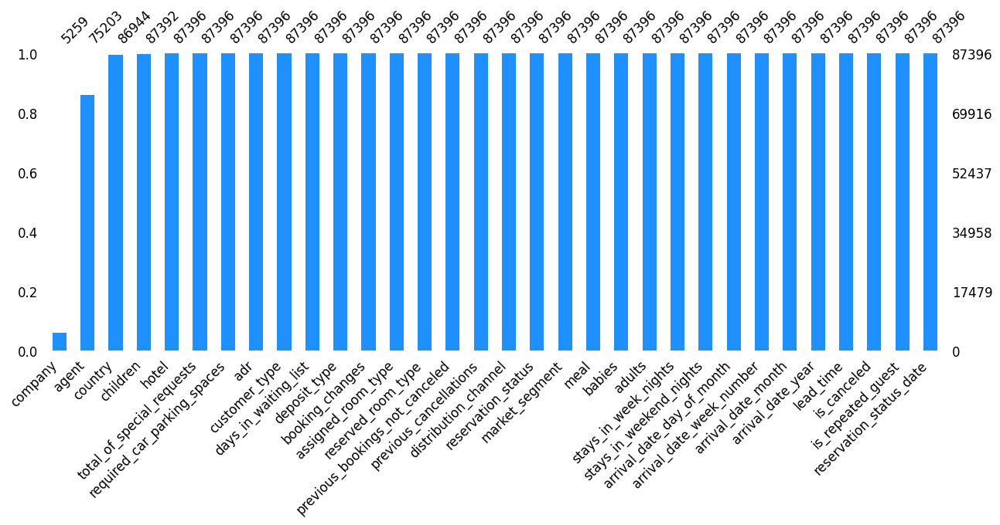

In [38]:
missingno.bar(data,color="dodgerblue", sort="ascending", figsize=(15,5), fontsize=12);

<AxesSubplot: >

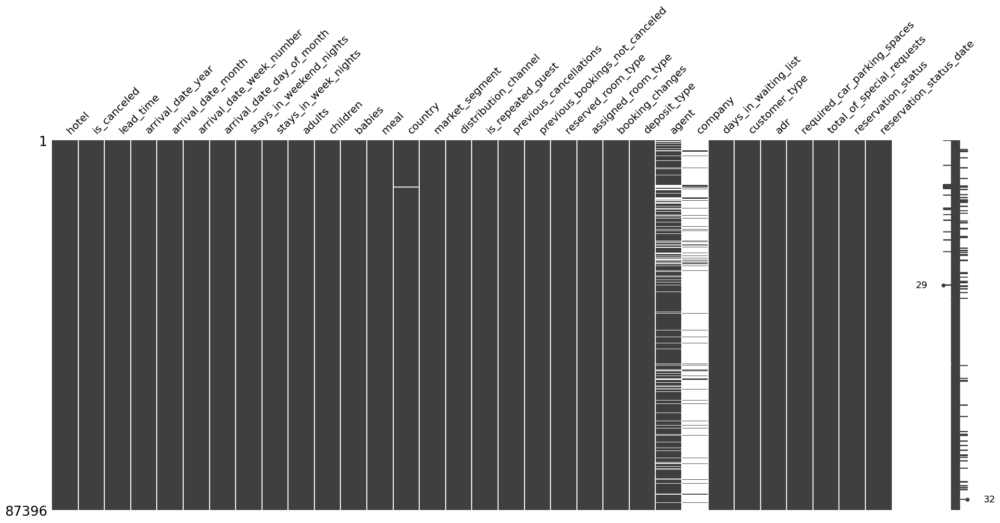

In [39]:
missingno.matrix(data)

**INSIGHT**

Pada grafik barplot diatas terlihat bahwa missing value ada di kolom company, agent, country, dan children. Dan missing value terbesar ada di kolom company sementara kolom country hanya sedikit data yang hilang, bahkan di grafik kolom children hampir tidak ada yang hilang karena memang hanya 4 row. Missing value ini akan di handle pada proses data cleaning.

Selain itu pada matrix diatas dapat dilihat data yang terdapat missing value tersebar dengan tidak berarutan.


In [40]:
# Handle missing value coloumn 'COUNTRY'
data['country'].fillna('UNK',inplace=True) #UNK for unknown
data2['country'].fillna('UNK',inplace=True) #Melakukan treatment yang sama untuk dataframe yang akan digunakan pada EDA
#Handle missing value column 'COMPANY' with delete the column because missing in the column is 94,3%
data.drop(['company'],axis=1,inplace=True)
data2.drop(['company'],axis=1,inplace=True)
#Handle missing value column 'agent' with deleting the column because it doesn't have a significant correlation with whether the hotel reservation is canceled or not.
data.drop(['agent'],axis=1,inplace=True)
data2.drop(['agent'],axis=1,inplace=True)
#Fill missing value in column children with 0
data['children'].fillna(0,inplace=True)
data2['children'].fillna(0,inplace=True) 


In [41]:
#Checking after handle missing value
data.isna().sum()

hotel                             0
is_canceled                       0
lead_time                         0
arrival_date_year                 0
arrival_date_month                0
arrival_date_week_number          0
arrival_date_day_of_month         0
stays_in_weekend_nights           0
stays_in_week_nights              0
adults                            0
children                          0
babies                            0
meal                              0
country                           0
market_segment                    0
distribution_channel              0
is_repeated_guest                 0
previous_cancellations            0
previous_bookings_not_canceled    0
reserved_room_type                0
assigned_room_type                0
booking_changes                   0
deposit_type                      0
days_in_waiting_list              0
customer_type                     0
adr                               0
required_car_parking_spaces       0
total_of_special_requests   

In [42]:
#Checking after handle missing value
data2.isna().sum()

hotel                             0
is_canceled                       0
lead_time                         0
arrival_date_year                 0
arrival_date_month                0
arrival_date_week_number          0
arrival_date_day_of_month         0
stays_in_weekend_nights           0
stays_in_week_nights              0
adults                            0
children                          0
babies                            0
meal                              0
country                           0
market_segment                    0
distribution_channel              0
is_repeated_guest                 0
previous_cancellations            0
previous_bookings_not_canceled    0
reserved_room_type                0
assigned_room_type                0
booking_changes                   0
deposit_type                      0
days_in_waiting_list              0
customer_type                     0
adr                               0
required_car_parking_spaces       0
total_of_special_requests   

**DELETE COLUMNS THAT ARE NOT NEEDED**

**Column reservation status**

In [43]:
# Column 'Reservation Status' and 'Is Canceled' are the same because the value 'no show' in the 'Reservation Status' column is represented as 1 in the 'Is Canceled' column. 
# Therefore, the treatment is to delete the 'Reservation Status' column.
display(data['reservation_status'].value_counts())
data_status=data[(data['reservation_status']=='No-Show')]
display(data_status['is_canceled'].value_counts())
data.drop(['reservation_status'],axis=1,inplace=True)
data2.drop(['reservation_status'],axis=1,inplace=True) #Melakukan treatment yang sama untuk dataframe yang akan digunakan pada EDA

reservation_status
Check-Out    63371
Canceled     23011
No-Show       1014
Name: count, dtype: int64

is_canceled
1    1014
Name: count, dtype: int64

**Column reservation_status_date**

In [44]:
# Pada kolom reservation status date dan kolom reservation status memiliki keterkaitan.
# karena ketika status nya dikatakan check out maka reservation status date akan terisi dengan tanggal terakhir penyewa pesan sedangkan,
# ketika dikatakan canceled  dan no-show berarti reservation status date yang tertampil adalah tanggal pemesana membatalkan pemesannya.
# Sehingga ketika kolom reservation status dihapus maka reservation status date juga dihapus

data.drop(['reservation_status_date'],axis=1,inplace=True)
data2.drop(['reservation_status_date'],axis=1,inplace=True)

**HANDLE OUTLIER**

**Column Lead Time**

In [45]:
Q1 = data['lead_time'].quantile(0.25)
Q3 = data['lead_time'].quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers = data[(data['lead_time'] < lower_bound) | (data['lead_time'] > upper_bound)]
jumlah=outliers['adr'].count()
print(outliers['is_canceled'].value_counts())
print(f'Jumlah Outlier adalah {jumlah}')
# display(outliers['lead_time'].unique())

is_canceled
0    1293
1    1103
Name: count, dtype: int64
Jumlah Outlier adalah 2396


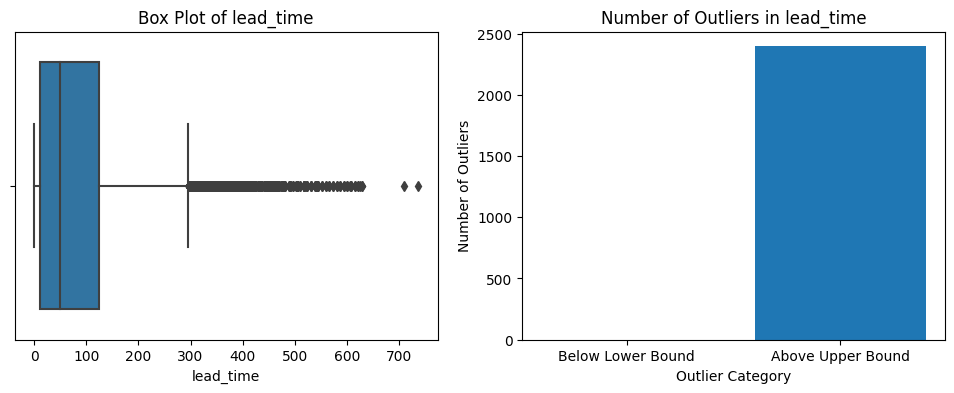

In [46]:
# Buat box plot
plt.figure(figsize=(12,4))
plt.subplot(1,2,1)
sns.boxplot(x=data['lead_time'])
plt.title('Box Plot of lead_time')

plt.subplot(1,2,2)
outliers_below = data[data['lead_time'] < lower_bound]
outliers_above = data[data['lead_time'] > upper_bound]
plt.bar(['Below Lower Bound', 'Above Upper Bound'], [len(outliers_below), len(outliers_above)])
plt.xlabel('Outlier Category')
plt.ylabel('Number of Outliers')
plt.title('Number of Outliers in lead_time')

plt.show()


**INSIGHT**

Grafik di atas menunjukkan bahwa outlier pada kolom "lead_time" hanya terdapat pada bagian Upper Bound dan tersebar pada data dengan lead time 300 ke atas. Namun, perlu diingat bahwa kebijakan mengenai kapan reservasi hotel dapat dilakukan jauh sebelum tanggal check-in dapat bervariasi antara hotel-hotel tertentu.

Oleh karena itu, pendekatan yang tepat untuk mengatasi outlier pada kolom "lead_time" adalah dengan tetap mempertahankan data tersebut. Hal ini disebabkan oleh kurangnya informasi yang dapat memvalidasi atau mengkonfirmasi apakah data outlier tersebut benar-benar salah atau tidak sesuai dengan kebijakan pemesanan hotel. Dengan demikian, data outlier ini dapat menjadi bagian yang penting dari analisis dan tidak seharusnya dihapus begitu saja.


**Column Arrival Date Year, Arrival Date Month, Arival Date Week, Arrival Date Day**

In [47]:
print(data['arrival_date_year'].unique())
print(data['arrival_date_month'].unique())
print(data['arrival_date_week_number'].unique())
print(data['arrival_date_day_of_month'].unique())

[2015 2016 2017]
['July' 'August' 'September' 'October' 'November' 'December' 'January'
 'February' 'March' 'April' 'May' 'June']
[27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50
 51 52 53  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21
 22 23 24 25 26]
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31]


**INSIGHT**

Kolom arrival date year,arrival date month, arrival date weak,dan arrival date day telah sesuai dengan sumber informasi data yang menyatakan bahwa data hotel demand dari tahun 2015-2017. Bulan tersedia dari Januari-Desember. Minggu tersedia dari 1-52. Tanggal dari 1-31.

**Column Stay in Weekend Nights & Stay in Week Nights**

In [48]:
Q1 = data['stays_in_weekend_nights'].quantile(0.25)
Q3 = data['stays_in_weekend_nights'].quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers = data[(data['stays_in_weekend_nights'] < lower_bound) | (data['stays_in_weekend_nights'] > upper_bound)]
jumlah=outliers['adr'].count()
print(f'Jumlah Outlier adalah {jumlah}')
display(outliers['stays_in_weekend_nights'].unique())
display(outliers[outliers['stays_in_weekend_nights']>10])

Jumlah Outlier adalah 220


array([ 6, 13,  8,  7, 12,  9, 16, 18, 19, 10, 14], dtype=int64)

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests
1655,Resort Hotel,0,30,2015,September,37,7,13,33,2,...,0,A,I,17,No Deposit,0,Transient,0.00,0,1
3820,Resort Hotel,1,122,2016,January,3,12,12,30,2,...,0,A,A,0,No Deposit,0,Transient,22.11,0,0
3850,Resort Hotel,0,214,2016,January,5,26,12,30,2,...,0,D,D,0,No Deposit,0,Transient,31.45,0,0
9839,Resort Hotel,1,322,2017,January,2,10,16,40,2,...,0,A,A,0,No Deposit,0,Transient,25.50,0,0
14037,Resort Hotel,0,113,2015,August,31,1,18,42,1,...,0,E,E,0,No Deposit,0,Transient,110.50,0,3
14038,Resort Hotel,0,126,2016,July,28,5,19,50,1,...,1,E,E,2,No Deposit,0,Transient,110.00,0,3
32589,Resort Hotel,0,1,2017,February,5,3,13,32,1,...,1,A,D,2,No Deposit,0,Transient,42.11,0,3
33924,Resort Hotel,0,71,2017,January,2,10,16,40,2,...,0,A,A,0,No Deposit,0,Transient,28.79,0,0
34614,Resort Hotel,0,242,2017,February,7,17,12,30,2,...,0,D,D,0,No Deposit,0,Transient,35.70,0,1
34898,Resort Hotel,0,150,2017,February,9,26,12,30,2,...,0,D,D,0,No Deposit,0,Contract,39.41,0,2


In [49]:
# Mengecek apakah ada anomali dalam outlier kolom stay in weekend nights
outliers[(outliers['stays_in_weekend_nights']>outliers['stays_in_week_nights'])]

#Mengecek data calon penyewa yang memesan untuk 0 malam tapi status tidak cancel(check-out)
data.drop(data[(data['stays_in_weekend_nights']==0)&(data['stays_in_week_nights']==0)&(data['is_canceled']==0)].index, inplace=True)


**INSIGHT**

Pada data, terlihat bahwa ada 217 data yang dianggap sebagai outlier dalam kolom "stays in weekend nights." Namun, setelah ditelusuri, ternyata ini adalah hal yang wajar. Hal ini terjadi karena calon penyewa yang melakukan reservasi kamar selama lebih dari 10 hari pada akhir pekan juga melakukan reservasi lebih dari 20 hari pada hari kerja. Dengan kata lain, reservasi ini memang masuk ke dalam kategori "long reservation."

Selanjutnya, kami melakukan pengecekan anomali dengan membandingkan kolom "stays in weekend nights" dengan kolom "stays in week nights." Hasilnya menunjukkan bahwa tidak ada calon penyewa yang melakukan reservasi lebih banyak di akhir pekan dibandingkan dengan hari kerja.

Hal ini menunjukkan bahwa dalam data tersebut, reservasi di akhir pekan dan hari kerja memiliki pola yang seimbang dan tidak ada anomali yang perlu dikhawatirkan terkait jumlah malam yang dihabiskan dalam reservasi.

**Column Adult**

In [50]:
Q1 = data['adults'].quantile(0.25)
Q3 = data['adults'].quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers = data[(data['adults'] < lower_bound) | (data['adults'] > upper_bound)]
jumlah=outliers['adr'].count()
print(f'Jumlah Outlier adalah {jumlah}')
display(outliers['adults'].unique())
display(outliers[outliers['adults']>4])

Jumlah Outlier adalah 22654


array([ 1,  3,  4, 40, 26, 50, 27, 55,  0, 20,  6,  5, 10], dtype=int64)

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests
1539,Resort Hotel,1,304,2015,September,36,3,0,3,40,...,0,A,A,0,No Deposit,0,Group,0.0,0,0
1587,Resort Hotel,1,333,2015,September,36,5,2,5,26,...,0,A,A,0,No Deposit,0,Group,0.0,0,0
1643,Resort Hotel,1,336,2015,September,37,7,1,2,50,...,0,A,A,0,No Deposit,0,Group,0.0,0,0
1752,Resort Hotel,1,340,2015,September,37,12,2,5,26,...,0,A,A,0,No Deposit,0,Group,0.0,0,0
1884,Resort Hotel,1,347,2015,September,38,19,2,5,26,...,0,A,A,0,No Deposit,0,Group,0.0,0,0
1917,Resort Hotel,1,349,2015,September,39,21,1,3,27,...,0,A,A,0,No Deposit,0,Group,0.0,0,0
1962,Resort Hotel,1,352,2015,September,39,24,1,3,27,...,0,A,A,0,No Deposit,0,Group,0.0,0,0
2003,Resort Hotel,1,354,2015,September,39,26,2,5,26,...,0,A,A,0,No Deposit,0,Group,0.0,0,0
2164,Resort Hotel,1,361,2015,October,40,3,2,5,26,...,0,A,A,0,No Deposit,0,Group,0.0,0,0
2173,Resort Hotel,1,338,2015,October,41,4,2,0,55,...,0,A,A,0,No Deposit,0,Group,0.0,0,0


In [51]:
#Delete data for column 'adult' more than 4 person in one reservation
data.drop(data[data['adults']>4].index, inplace=True)
data2.drop(data2[data2['adults']>4].index, inplace=True)

**INSIGHT**

Pada kolom "adult," terdapat 16 reservasi di mana calon penyewa memesan kamar untuk lebih dari 4 orang dewasa. Ini dapat dianggap sebagai anomali karena berdasarkan referensi (https://kumparan.com/jendela-dunia/5-jenis-kamar-hotel-berdasarkan-tempat-tidur-1zfPQCc9DEt/full), jenis kamar hotel yang paling umum adalah Quadruple Room yang biasanya dapat menampung maksimal 4 orang.

Dalam mengatasi anomali ini, langkah yang tepat adalah dengan menghapus data yang mengandung informasi bahwa jumlah adult melebihi 4 orang dalam satu reservasi. Hal ini dilakukan untuk menjaga konsistensi dengan kapasitas maksimal kamar hotel yang umumnya tersedia.

**Column Children & Babies**

In [52]:
#Check for outliers in the 'babies' column. The data indicates that there are two datas with more than 5 babies, while there are only 2 adults and 1 person in other datas.
# The action is to drop the data, because it is anomaly
print(data[data['babies']>5].to_string())
data.drop(data[data['babies']>5].index, inplace=True)
data2.drop(data2[data2['babies']>5].index, inplace=True)

#same treatment used in the 'children' columns
print(data[data['children']>5].to_string())
data.drop(data[data['children']>5].index, inplace=True)
data2.drop(data2[data2['children']>5].index, inplace=True)

            hotel  is_canceled  lead_time  arrival_date_year arrival_date_month  arrival_date_week_number  arrival_date_day_of_month  stays_in_weekend_nights  stays_in_week_nights  adults  children  babies meal country market_segment distribution_channel  is_repeated_guest  previous_cancellations  previous_bookings_not_canceled reserved_room_type assigned_room_type  booking_changes deposit_type  days_in_waiting_list    customer_type    adr  required_car_parking_spaces  total_of_special_requests
46619  City Hotel            0         37               2016            January                         3                         12                        0                     2       2       0.0      10   BB     PRT      Online TA                TA/TO                  0                       0                               0                  D                  D                1   No Deposit                     0        Transient  84.45                            0                          1


**Column Meal**

In [53]:
# Seperti informasi pada dictionary, untuk nilai undefined diterjemahkan sebagai no-meal(SC)
data['meal'].replace('Undefined','SC',inplace=True)
data2['meal'].replace('Undefined','SC',inplace=True)

In [54]:
data2.columns

Index(['hotel', 'is_canceled', 'lead_time', 'arrival_date_year',
       'arrival_date_month', 'arrival_date_week_number',
       'arrival_date_day_of_month', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies', 'meal',
       'country', 'market_segment', 'distribution_channel',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'deposit_type',
       'days_in_waiting_list', 'customer_type', 'adr',
       'required_car_parking_spaces', 'total_of_special_requests'],
      dtype='object')

**Column Market Segment**

In [55]:
# Pada column market segment cara menghandle outlier adalah dengan menghapus data dengan 'market segment' = undefined karena tidak bisa dimasukan kedalam 7 golongan tersebut.
# Dan tidak dapat digunakan untuk EDA analisis.
# List semua kategori golongan yang valid
valid_market_segments = ['Online TA', 'Offline TA/TO', 'Groups', 'Direct', 'Corporate', 'Complementary', 'Aviation']

# Hapus data dengan 'market segment' yang tidak termasuk dalam kategori valid
data2 = data2[data2['market_segment'].isin(valid_market_segments)]


**Column Distribution Channel**

In [56]:
#Cara menghandle outlier pada kolom distribution channel sama dengan market segment yaitu dengan menghapus data yang berisikan nilai undefined
valid_distribution_channel = ['TA/TO','Direct','Corporate','GDS']

# Hapus data dengan 'market segment' yang tidak termasuk dalam kategori valid
data2 = data2[data2['distribution_channel'].isin(valid_distribution_channel)]

**Column Days in Waiting List**

In [57]:
#Value yang terdapat pada kolom days in waiting list
print(data['days_in_waiting_list'].unique())

#Banyaknya data yang lebih dari 100 hari
display(data[data['days_in_waiting_list']>100])

# Melakukan pengecekan apakah ada reservasi dengan waktu tunggu (days_in_waiting_list) yang lebih besar daripada lead time.
# Hal ini akan membantu kita mengidentifikasi situasi di mana seseorang memesan kamar untuk check-in dalam waktu singkat (lead time singkat), tetapi memiliki waktu tunggu yang cukup lama sebelum reservasi mereka diproses.
display(data[(data['days_in_waiting_list']>data['lead_time'])])

[  0  47  65 122  75 101 150 125  14  60  34  50 100  22 121  61  39   5
   1   8 107  43  52   2  11 142 116  13  44  97  83   4 113  18  20 185
  93 109   6  37 105 154  64  99  38  48  33  77  21  80  59  40  89  58
  53  49  69  87  91  57 111  79  98  85  63  15   3  41 224  31  56 187
 176  71  55 259 236  96 207 215 160 120  30  32  27  62  24 108 147 379
  70  35 178 330 223 174 162 391  68 193  10  76  16  28   9 165  17  25
  46   7  84 175 183  23 117  12  54  26  73  45  19  42  72  81  92  74
 167  36]


,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests
3661,Resort Hotel,0,165,2015,December,53,30,0,4,2,...,0,A,A,1,No Deposit,122,Transient-Party,136.50,0,0
3664,Resort Hotel,0,165,2015,December,53,30,0,4,1,...,0,A,A,1,No Deposit,122,Transient-Party,0.00,0,0
3666,Resort Hotel,0,165,2015,December,53,30,0,4,2,...,0,A,A,2,No Deposit,122,Transient-Party,136.50,0,0
3675,Resort Hotel,0,165,2015,December,53,30,0,4,1,...,0,A,A,0,No Deposit,122,Transient-Party,0.00,0,0
3676,Resort Hotel,0,165,2015,December,53,30,0,4,2,...,0,A,A,0,No Deposit,122,Transient-Party,138.50,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99138,City Hotel,0,349,2016,October,41,4,1,5,2,...,0,A,A,0,No Deposit,162,Transient-Party,123.33,0,0
99149,City Hotel,0,349,2016,October,41,4,1,5,1,...,0,A,A,0,No Deposit,162,Transient-Party,96.67,0,0
103568,City Hotel,0,208,2016,December,53,27,0,1,2,...,0,A,A,2,No Deposit,167,Transient-Party,81.00,0,1
107882,City Hotel,0,244,2017,March,11,16,1,3,2,...,0,A,A,1,No Deposit,223,Transient-Party,39.00,0,0


,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests


**INSIGHT**

Jumlah Waiting list yang besar pada data ini bukanlah anomali karena jarak antara pemesan melakukan reservasi dengan waktu check in juga berjauhan. Sehingga waiting list yang lama dipengaruhi oleh lead time yang besar. Yang artinya pemesan melakukan pemesanan jauh jauh hari sehingga masuk ke dalam waiing list yang lama juga

**Column ADR**

In [58]:
# Menampilkan data dengan 'adr' sama dengan 0.0 atau kurang dari 0
display(data[data['adr'] == 0.0])
display(data[data['adr'] < 0])

# Menghapus data dengan 'adr' sama dengan 0.0 atau kurang dari 0
data = data[(data['adr'] != 0.0) & (data['adr'] > 0)]
data2 = data2[(data2['adr'] != 0.0) & (data2['adr'] > 0)]
display(data[data['adr'] < 0])

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests
125,Resort Hotel,0,32,2015,July,27,4,0,1,4,...,0,H,H,2,No Deposit,0,Transient,0.0,0,1
421,Resort Hotel,1,57,2015,July,29,15,0,2,2,...,0,A,A,0,No Deposit,0,Transient-Party,0.0,0,0
428,Resort Hotel,0,57,2015,July,29,15,0,2,1,...,0,A,A,1,No Deposit,0,Transient-Party,0.0,0,0
1545,Resort Hotel,1,297,2015,September,36,3,1,3,2,...,0,A,A,0,No Deposit,0,Transient,0.0,0,0
1655,Resort Hotel,0,30,2015,September,37,7,13,33,2,...,0,A,I,17,No Deposit,0,Transient,0.0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
117960,City Hotel,0,9,2017,August,32,12,2,1,2,...,0,A,K,3,No Deposit,0,Transient-Party,0.0,0,0
118142,City Hotel,0,504,2017,August,32,12,2,1,1,...,0,A,A,3,No Deposit,0,Transient-Party,0.0,0,0
118762,City Hotel,0,1,2017,August,34,24,0,1,2,...,0,A,D,1,No Deposit,0,Transient,0.0,0,3
119102,City Hotel,0,518,2017,August,34,26,2,1,1,...,0,A,A,1,No Deposit,0,Transient-Party,0.0,0,0


,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests
14969,Resort Hotel,0,195,2017,March,10,5,4,6,2,...,2,A,H,2,No Deposit,0,Transient-Party,-6.38,0,0


,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests


**INSIGHT**

Jika data adr (harga hotel) memiliki nilai 0 dan minus (-), maka hal ini dapat dikatakan sebagai anomali. Harga hotel yang 0 atau (-) tidak masuk akal dalam konteks hotel, karena biasanya setiap kamar hotel memiliki harga yang berbeda-beda. Anomali ini bisa terjadi karena beberapa alasan, seperti kesalahan dalam pengisian data atau masalah teknis.

In [59]:
# Setelah handle missing value dan outlier

# Menghitung jumlah data duplikat
duplicate_count = len(data[data.duplicated()])

# Menghitung persentase data duplikat dari total data
duplicate_percentage = (duplicate_count / len(data)) * 100

# Mencetak jumlah data duplikat dan persentasenya
print(f"Data duplikat berjumlah {duplicate_count} atau {duplicate_percentage:.2f}%")
print(data[data.duplicated()].to_string())

Data duplikat berjumlah 286 atau 0.33%
               hotel  is_canceled  lead_time  arrival_date_year arrival_date_month  arrival_date_week_number  arrival_date_day_of_month  stays_in_weekend_nights  stays_in_week_nights  adults  children  babies meal country market_segment distribution_channel  is_repeated_guest  previous_cancellations  previous_bookings_not_canceled reserved_room_type assigned_room_type  booking_changes deposit_type  days_in_waiting_list    customer_type     adr  required_car_parking_spaces  total_of_special_requests
1375    Resort Hotel            1         57               2015             August                        35                         27                        1                     3       2       0.0       1   HB     PRT  Offline TA/TO                TA/TO                  0                       0                               0                  A                  A                0   No Deposit                     0        Transient  133.00          

In [60]:
#Drop Duplicate Data
data.drop_duplicates(keep='last',inplace=True)
data

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,0,A,C,0,No Deposit,0,Transient,75.00,0,0
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,0,A,A,0,No Deposit,0,Transient,75.00,0,0
5,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,0,A,A,0,No Deposit,0,Transient,98.00,0,1
6,Resort Hotel,0,0,2015,July,27,1,0,2,2,...,0,C,C,0,No Deposit,0,Transient,107.00,0,0
7,Resort Hotel,0,9,2015,July,27,1,0,2,2,...,0,C,C,0,No Deposit,0,Transient,103.00,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119385,City Hotel,0,23,2017,August,35,30,2,5,2,...,0,A,A,0,No Deposit,0,Transient,96.14,0,0
119386,City Hotel,0,102,2017,August,35,31,2,5,3,...,0,E,E,0,No Deposit,0,Transient,225.43,0,2
119387,City Hotel,0,34,2017,August,35,31,2,5,2,...,0,D,D,0,No Deposit,0,Transient,157.71,0,4
119388,City Hotel,0,109,2017,August,35,31,2,5,2,...,0,A,A,0,No Deposit,0,Transient,104.40,0,0


# EDA 
*for analysis*

In [61]:
data2.to_excel('Hotel_Demand_Clean.xlsx')

is_canceled
0    73416
1    44006
Name: count, dtype: int64


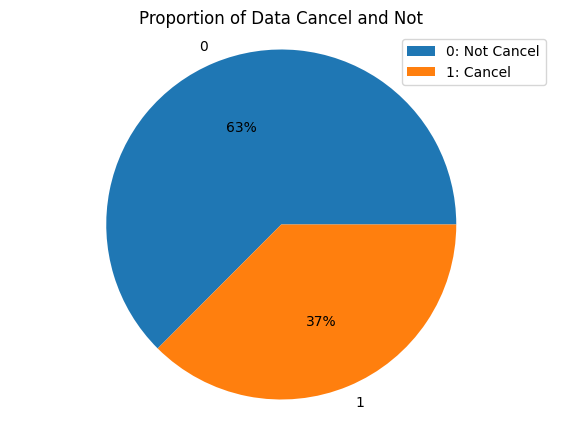

In [62]:
#PROPORSI DATA CANCEL AND DATA NOT CANCEL
print(data2['is_canceled'].value_counts())

data_proportion=data2['is_canceled'].value_counts()/len(data2)*100

plt.figure(figsize=(7,5))
plt.pie(data_proportion,labels=data_proportion.index,autopct='%1.0f%%')
plt.title('Proportion of Data Cancel and Not')
plt.legend(['0: Not Cancel', '1: Cancel'], loc='upper right')
plt.axis('equal')
plt.show()

**INSIGHT**
Pada data ini terdapat jumlah 2 nilai X yang tidak sama banyak.
- Kategori 1(Cancel): 27% atau 23761
- Kategori 2 (tidak cancel): 73% atau 63349


Terlihat bahwa data memiliki ketidakseimbangan kelas di mana kelas "tidak cancel" memiliki jumlah yang lebih besar dibandingkan dengan kelas "cancel". Ketidakseimbangan kelas dapat memengaruhi performa model machine learning, terutama pada kelas minoritas (dalam hal ini, kelas "cancel"). Hal ini akan dilakukan treatment dalam proses kalsifikasi

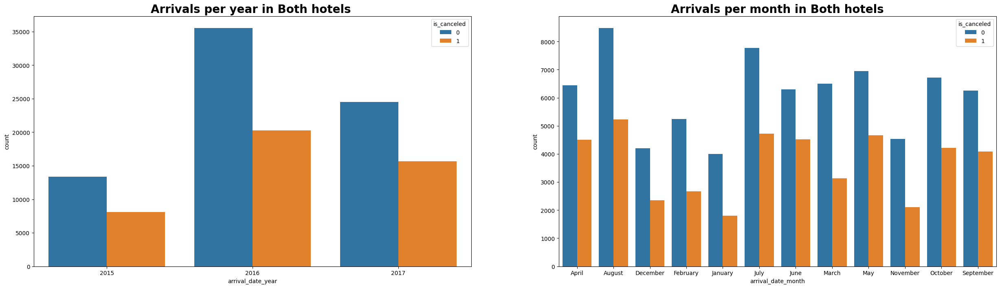

In [63]:
plt.figure(figsize=(15, 8))
grouped_data = data2.groupby(["arrival_date_year", "is_canceled"]).size().reset_index(name="count")

plt.subplot(1, 2, 1)
sns.barplot(data=grouped_data, x="arrival_date_year", y="count", hue="is_canceled")
plt.title("Arrivals per year in Both hotels ",fontweight="bold", size=20)

grouped_data = data2.groupby(["arrival_date_month", "is_canceled"]).size().reset_index(name="count")

plt.subplot(1, 2, 2)
sns.barplot(data=grouped_data, x="arrival_date_month", y="count", hue="is_canceled")
plt.title('Arrivals per month in Both hotels',fontweight="bold", size=20)
plt.subplots_adjust(right=1.7)


plt.show()

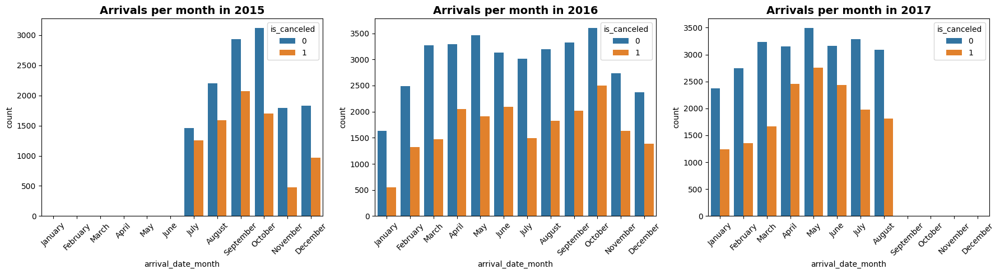

In [64]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
months = ["January", "February", "March", "April", "May", "June", 
          "July", "August", "September", "October", "November", "December"]
data2['arrival_date_month'] = pd.Categorical(data2['arrival_date_month'], categories=months, ordered=True)

# Assuming you have a DataFrame named 'data2' with columns 'arrival_date_month', 'is_canceled', and 'arrival_date_year'

# Filter data for each year
data_2015 = data2[data2['arrival_date_year'] == 2015]
data_2016 = data2[data2['arrival_date_year'] == 2016]
data_2017 = data2[data2['arrival_date_year'] == 2017]

# Create subplots for each year
plt.figure(figsize=(18, 5))

# Plot for 2015
plt.subplot(1, 3, 1)
grouped_data_2015 = data_2015.groupby(["arrival_date_month", "is_canceled"]).size().reset_index(name="count")
sns.barplot(data=grouped_data_2015, x="arrival_date_month", y="count", hue="is_canceled",
            order=grouped_data_2015.groupby("arrival_date_month")["count"].sum().index)
plt.title('Arrivals per month in 2015', fontweight="bold", size=14)
plt.xticks(rotation=45)

# Plot for 2016
plt.subplot(1, 3, 2)
grouped_data_2016 = data_2016.groupby(["arrival_date_month", "is_canceled"]).size().reset_index(name="count")
sns.barplot(data=grouped_data_2016, x="arrival_date_month", y="count", hue="is_canceled",
            order=grouped_data_2016.groupby("arrival_date_month")["count"].sum().index)
plt.title('Arrivals per month in 2016', fontweight="bold", size=14)
plt.xticks(rotation=45)

# Plot for 2017
plt.subplot(1, 3, 3)
grouped_data_2017 = data_2017.groupby(["arrival_date_month", "is_canceled"]).size().reset_index(name="count")
sns.barplot(data=grouped_data_2017, x="arrival_date_month", y="count", hue="is_canceled",
            order=grouped_data_2017.groupby("arrival_date_month")["count"].sum().index)
plt.title('Arrivals per month in 2017', fontweight="bold", size=14)
plt.xticks(rotation=45)

# Adjust spacing between subplots
plt.subplots_adjust(wspace=0.3)

# Show the plots
plt.tight_layout()
plt.show()


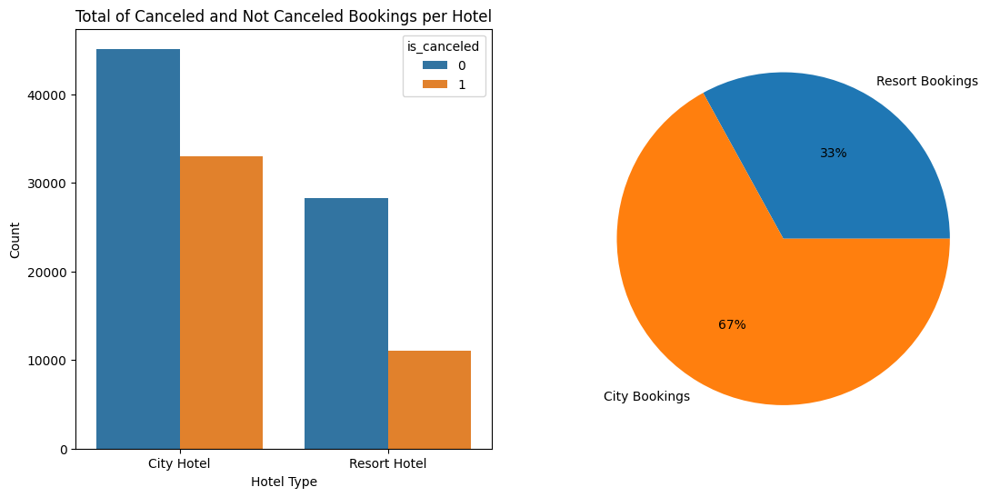

In [65]:
# Group the data by "market_segment" and "is_canceled"
grouped_data = data2.groupby(["hotel", "is_canceled"]).size().reset_index(name="count")

# Create the barplot
plt.figure(figsize=(13, 6))

plt.subplot(1,2,1)
sns.barplot(data=grouped_data, x="hotel", y="count", hue="is_canceled")
plt.title("Total of Canceled and Not Canceled Bookings per Hotel")
plt.xlabel("Hotel Type")
plt.ylabel("Count")

plt.subplot(1,2,2)
total_booking = len(data2['hotel'])
resort_booking = round(len(data2[data2['hotel']== 'Resort Hotel']) / total_booking * 100)
city_booking = round(len(data2[data2['hotel']== 'City Hotel']) / total_booking *  100)

plt.pie([resort_booking, city_booking], labels=['Resort Bookings', 'City Bookings'], autopct='%.0f%%')
plt.show()

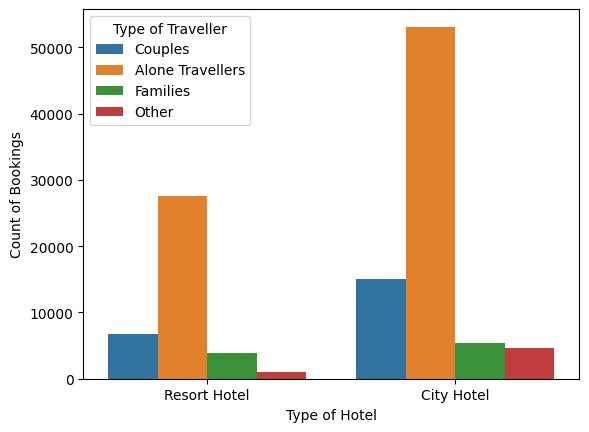

In [66]:
hotel_type = list(data2['hotel'].unique())
conditions = [
    (data2['adults'] == 1) & (data2['children'] == 0) & (data2['babies'] == 0),
    (data2['adults'] == 2) & (data2['children'] == 0) & (data2['babies'] == 0),
    (data2['children'] > 0) | (data2['babies'] > 0)
]
values = ['Alone Travellers', 'Couples', 'Families']

data2['traveller_type'] = np.select(conditions, values)
sns.countplot(data=data2, x='hotel', hue='traveller_type')
plt.xlabel('Type of Hotel')
plt.ylabel('Count of Bookings')
plt.legend(title = 'Type of Traveller', labels= ['Couples', 'Alone Travellers', 'Families', 'Other'])

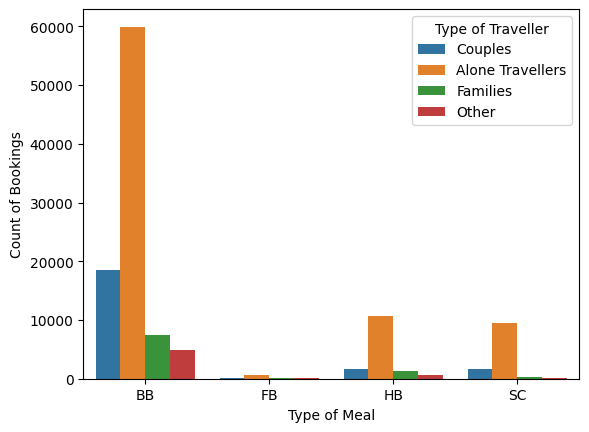

In [67]:
hotel_type = list(data2['hotel'].unique())
conditions = [
    (data2['adults'] == 1) & (data2['children'] == 0) & (data2['babies'] == 0),
    (data2['adults'] == 2) & (data2['children'] == 0) & (data2['babies'] == 0),
    (data2['children'] > 0) | (data2['babies'] > 0)
]
values = ['Alone Travellers', 'Couples', 'Families']

data2['traveller_type'] = np.select(conditions, values)
sns.countplot(data=data2, x='meal', hue='traveller_type')
plt.xlabel('Type of Meal')
plt.ylabel('Count of Bookings')
plt.legend(title = 'Type of Traveller', labels= ['Couples', 'Alone Travellers', 'Families', 'Other'])

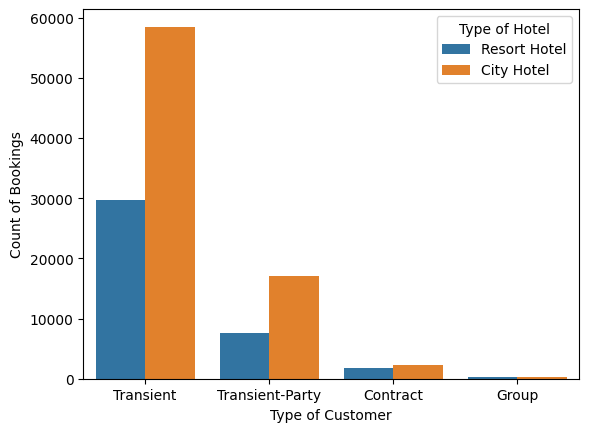

In [68]:
data2['customer_type'].unique()
sns.countplot(data=data2, x='customer_type', order= data2['customer_type'].value_counts().index, hue='hotel')
plt.xlabel('Type of Customer')
plt.ylabel('Count of Bookings')
plt.legend(title = 'Type of Hotel')

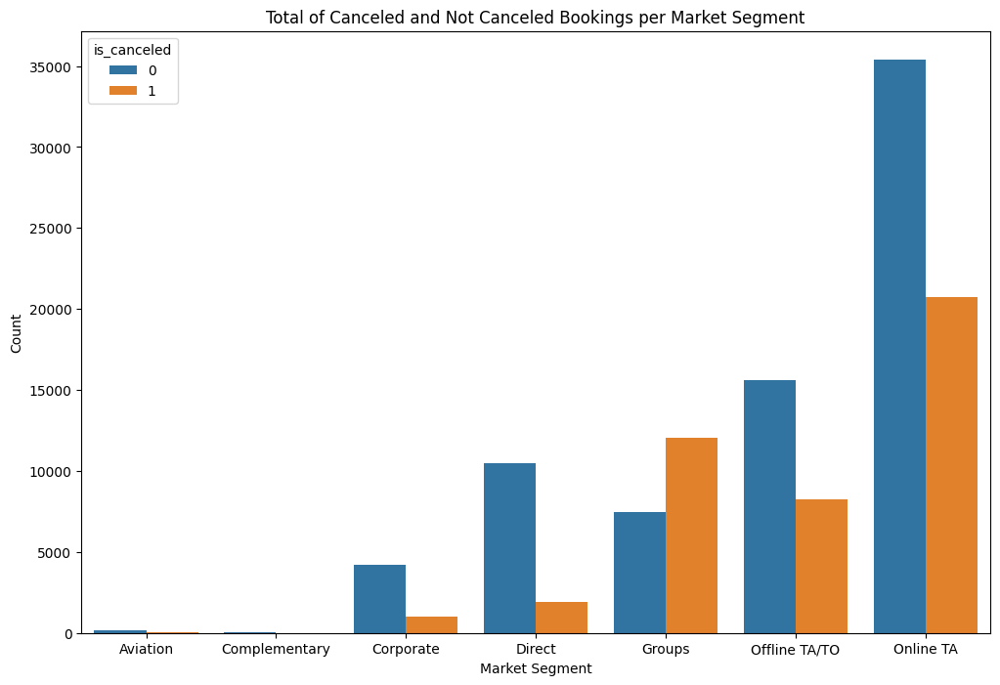

In [69]:
# Group the data by "market_segment" and "is_canceled"
grouped_data = data2.groupby(["market_segment", "is_canceled"]).size().reset_index(name="count")

# Create the barplot
plt.figure(figsize=(12, 8))
sns.barplot(data=grouped_data, x="market_segment", y="count", hue="is_canceled")
plt.title("Total of Canceled and Not Canceled Bookings per Market Segment")
plt.xlabel("Market Segment")
plt.ylabel("Count")
plt.show()

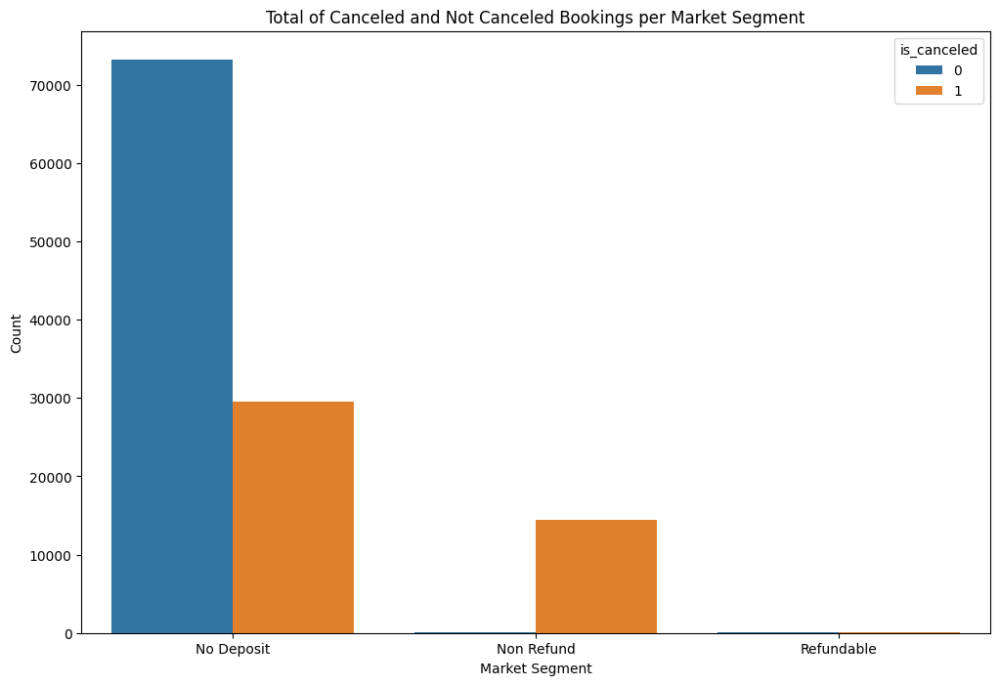

In [70]:
# Group the data by "market_segment" and "is_canceled"
grouped_data = data2.groupby(["deposit_type", "is_canceled"]).size().reset_index(name="count")
# Create the barplot
plt.figure(figsize=(12, 8))
sns.barplot(data=grouped_data, x="deposit_type", y="count", hue="is_canceled")
plt.title("Total of Canceled and Not Canceled Bookings per Market Segment")
plt.xticks(rotation=0)
plt.xlabel("Market Segment")
plt.ylabel("Count")
plt.show()

In [71]:
import plotly.express as px

# get number of actual guests by country
country_data = pd.DataFrame(data2.loc[data2["is_canceled"] == 0]["country"].value_counts())
country_data.rename(columns={"count": "Number of Guests"}, inplace=True)
total_guests = country_data["Number of Guests"].sum()
country_data["Guests in %"] = round(country_data["Number of Guests"] / total_guests * 100, 2)
country_data["country"] = country_data.index

# Sort by the number of guests in descending order and select the top 10
top_10_countries = country_data.sort_values(by="Number of Guests", ascending=False).head(10)

# Pie plot
fig = px.pie(top_10_countries,
             values="Number of Guests",
             names="country",
             title="Top 10 Home Countries of Guests",
             template="seaborn")
fig.update_traces(textposition="inside", textinfo="value+percent+label")
fig.show()


Setelah menggali lebih dalam dalam data kami, kami sampai pada kesimpulan berikut:

1. Terdapat puncak aktivitas reservasi pada bulan Mei dan Oktober, yang kemungkinan sesuai dengan musim liburan atau peristiwa khusus. Namun, perlu dicatat bahwa terjadi peningkatan yang signifikan dalam pembatalan reservasi pada tahun 2017, meskipun puncak musim liburan bulan Oktober belum tercapai.

2. Secara keseluruhan, terdapat lebih banyak pemesanan di hotel kota (61%) dibandingkan dengan pemesanan di resor (39%).

3. Tingkat pembatalan pemesanan di hotel kota lebih tinggi dibandingkan dengan hotel resor.

4. Pelancong tunggal cenderung lebih sering melakukan pemesanan hotel daripada keluarga atau pasangan tanpa anak.

5. Pasangan dan pelancong tunggal cenderung memesan paket Bed & Breakfast, sedangkan pilihan makanan penuh (Full board) tidak begitu populer di kalangan pelancong.

6. Pemesanan transient (tamu yang tidak tinggal lama) merupakan jenis pemesanan yang paling umum, terutama untuk hotel di kota.

7. Jumlah reservasi di resor cenderung lebih tinggi untuk pelanggan yang memiliki kontrak dengan hotel.

8. Dalam kategori pemesanan grup, tingkat pembatalan lebih tinggi daripada tingkat pemesanan. Hal ini mungkin terjadi karena ketika satu orang dalam grup membatalkan reservasi, maka seluruh grup tersebut akan otomatis dibatalkan.

9. Deposit jenis "non deposit" adalah yang paling banyak digunakan, dan ini menjadi alasan mengapa sistem prediksi pembatalan reservasi dibangun. Alasannya adalah bahwa ketika sistem telah memprediksi bahwa calon penyewa mungkin akan membatalkan reservasi, pihak hotel dapat memberitahu mereka untuk melakukan pembayaran uang muka (DP) terlebih dahulu. Dengan cara ini, pihak hotel dapat mengurangi potensi kerugian dan calon penyewa tidak akan merasa kecewa jika reservasinya dibatalkan secara sepihak.

10. 9 negara teratas selain portogal yang melakukan reservasi paling banyak adalah Great Britain, France, Spain, Germany, Ireland, Itali, Belgium, Netherland, dan USA.


# CLASSIFICATION

**DATA PREPARTAION**

In [72]:
# Pilih kolom-kolom numerik
numeric_columns = data.select_dtypes(include=['number'])

# Hitung korelasi
cancel_corr = numeric_columns.corr()["is_canceled"]
cancel_corr.abs().sort_values(ascending=False)[1:]


required_car_parking_spaces       0.185808
lead_time                         0.180669
total_of_special_requests         0.120414
adr                               0.119548
booking_changes                   0.091756
arrival_date_year                 0.088157
adults                            0.083740
is_repeated_guest                 0.081759
stays_in_week_nights              0.079348
children                          0.068088
stays_in_weekend_nights           0.056686
previous_cancellations            0.052661
previous_bookings_not_canceled    0.049825
babies                            0.021110
arrival_date_day_of_month         0.004973
arrival_date_week_number          0.002475
days_in_waiting_list              0.002086
Name: is_canceled, dtype: float64

Jenis value dalam data ini sangatlah beragam, ada beberapa kolom yang masih berupa object sehingga membutuhkan proses encoders untuk merubahnya menjadi numerik sebelum masuk pada tahap klasifikasi.

- ONE HOT ENCODERS
    1. Hotel,Meal,distribution_channel,deposit_type,customer_type
        
        Pada kolom ini memiliki paling banyak 5 value dan nilai-nilai yang ada tidak menunjukan tingkatan antara satu dengan yang lain sehingga encoder yang sesuai untuk digunakan adalah OHE
    2. Country
        
        Pada kolom ini memiliki banyak sekali unique value, tapi untuk membuatnya lebih mudah untuk memahami pattern pada tahap klasifikasi, kolom ini akan diubah menjadi hanya 2 unique value dan menggunakan one hot encoder, karena ini data hotel portugal maka akan diubah menjadi data calon penyewa dari negara portugal dan lainnya dubah menjadi data calon penyewa dari negara non-portugal.
- BINARY ENCODERS
    1. 'Market Segment','assigned_room_type',' reserved_room_type'
        
        Pada kolom ini akan menggunakan binary encoding dengan alasan unique value nya lebih dari 5 dan nilai yang ada tidak menunjukan tingkatan antara satu dengan yang lain.
    2. 'arrival_date_month'
        
        Pada kolom ini memang menjelaskan tentang bulan yang di kehidupan sehari hari, januari dikatakan bulan pertama tapi pada dasarnya bulan ke-1 tidak berarti akan lebih rendah daripada bulan ke-2 karena konteks nya bukan termasuk tingkatan. Sehingga encoder yang sesuai adalah binary encoders karena unique value pada kolom ini lebih dari 5.


In [73]:
# Transformer
numeric_columns=['lead_time',
                 'arrival_date_year',
                 'arrival_date_week_number',
                 'arrival_date_day_of_month',
                 'stays_in_weekend_nights',
                 'stays_in_week_nights',
                 'adults',
                 'children',
                 'babies',
                 'is_repeated_guest',
                 'previous_cancellations',
                 'previous_bookings_not_canceled',
                 'booking_changes',
                 'days_in_waiting_list',
                 'adr',
                 'required_car_parking_spaces',
                 'total_of_special_requests']


In [74]:
transformer = ColumnTransformer([
    ('onehot', OneHotEncoder(drop='first'), ['hotel','meal','distribution_channel','deposit_type','customer_type']),
    ('binary', ce.BinaryEncoder(), ['market_segment','assigned_room_type','reserved_room_type','arrival_date_month','country']),
    ('scaler', RobustScaler(), numeric_columns)
], remainder='passthrough')

In [75]:
# Select Target(column) for define X and Y
x = data.drop(columns=['is_canceled'])
y = data['is_canceled']

In [76]:
# Split
x_train, x_test, y_train, y_test = train_test_split(
    x, 
    y,
    test_size=0.2,
    random_state=100,
    stratify=y
)

**MODELLING**

In [77]:
# model

logreg = LogisticRegression()
knn = KNeighborsClassifier()
dt = DecisionTreeClassifier()
rf = RandomForestClassifier()
xgb = XGBClassifier()
lgbm = lgb.LGBMClassifier()

In [78]:
models = [logreg,knn,dt,rf,xgb,lgbm]

list_all=[]
list_mean=[]
list_std=[]


from sklearn.metrics import make_scorer, recall_score
from sklearn.model_selection import cross_val_score

# Define the recall scorer
recall_scorer = make_scorer(recall_score)

for i in models:
    pipe_model = Pipeline(
        [
            ('resampler', None),
            ('preprocessing', transformer),
            ('modelling', i)
        ]
    )
    
    cv_score = cross_val_score(
        estimator=pipe_model,
        X=x_train,
        y=y_train,
        cv=5,
        scoring=recall_scorer  # Use the recall_scorer here
    )

    list_all.append(cv_score.round(2))
    list_mean.append(cv_score.mean())
    list_std.append(cv_score.std())


In [79]:
df_cv = pd.DataFrame({
    'algo': models,
    'mean': list_mean,
    'std': list_std,
    'all': list_all
})

df_cv.sort_values('mean',ascending=False)

,algo,mean,std,all
4,"XGBClassifier(base_score=None, booster=None, c...",0.641729,0.006478,"[0.63, 0.65, 0.64, 0.64, 0.65]"
5,LGBMClassifier(),0.620944,0.006920,"[0.62, 0.62, 0.61, 0.63, 0.63]"
3,RandomForestClassifier(),0.606257,0.003080,"[0.6, 0.61, 0.6, 0.61, 0.61]"
2,DecisionTreeClassifier(),0.605567,0.007849,"[0.59, 0.61, 0.61, 0.61, 0.61]"
1,KNeighborsClassifier(),0.567709,0.007869,"[0.57, 0.57, 0.56, 0.57, 0.58]"
0,LogisticRegression(),0.418505,0.009604,"[0.43, 0.41, 0.41, 0.42, 0.43]"


**HYPERPARAMATER TUNNING UNTUK PARAMETER XGB CLASSIFIER**

In [80]:
# hyperparameter untuk XGB Classifier
ros = RandomOverSampler(random_state=0)

hyperparam_space= {
    'model__n_estimators': [100, 200, 300],
    'model__learning_rate': [0.01, 0.1, 0.2],
    'model__max_depth': [3, 4, 5],
    'model__min_child_weight': [1, 2, 3],
    'model__gamma': [0, 0.1, 0.2]
}                

# pipeline
pipe_model = Pipeline([
    ('resampler', ros),
    ('prep', transformer),
    ('model', xgb)                  # benchmark model terpilih
])

# Define Random Search
random_search_ros = RandomizedSearchCV(
    estimator=pipe_model,           # model  
    param_distributions=hyperparam_space,    # hyperparameter yang mau dituning
    cv=5,                           # jumlah fold  
    scoring='recall',                   # metrics
    n_jobs=-1,
    random_state=50,
    n_iter=20                    # pakai semua processor
)

In [81]:
# fitting 
random_search_ros.fit(x_train, y_train)

RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('resampler',
                                              RandomOverSampler(random_state=0)),
                                             ('prep',
                                              ColumnTransformer(remainder='passthrough',
                                                                transformers=[('onehot',
                                                                               OneHotEncoder(drop='first'),
                                                                               ['hotel',
                                                                                'meal',
                                                                                'distribution_channel',
                                                                                'deposit_type',
                                                                                'customer_type']),
                                                                              ('binary',
                                                                               BinaryEncoder(),
                                                                               ['market_segment',
                                                                                'assigned_room_type',
                                                                                'reserved_roo...
                                                            monotone_constraints=None,
                                                            n_estimators=100,
                                                            n_jobs=None,
                                                            num_parallel_tree=None,
                                                            predictor=None,
                                                            random_state=None, ...))]),
                   n_iter=20, n_jobs=-1,
                   param_distributions={'model__gamma': [0, 0.1, 0.2],
                                        'model__learning_rate': [0.01, 0.1,
                                                                 0.2],
                                        'model__max_depth': [3, 4, 5],
                                        'model__min_child_weight': [1, 2, 3],
                                        'model__n_estimators': [100, 200, 300]},
                   random_state=50, scoring='recall')

In [82]:
# score terbaik
random_search_ros.best_score_ 


0.8767232237539767

In [83]:
# hyperparameter terbaik
random_search_ros.best_params_

{'model__n_estimators': 100,
 'model__min_child_weight': 2,
 'model__max_depth': 5,
 'model__learning_rate': 0.01,
 'model__gamma': 0.2}

**HYPERPARAM UNTUK SAMPLER**
*(Karena data imbalance)*

In [84]:
# Define the model
xgb = XGBClassifier(
    n_estimators=100,
    min_child_weight=2,
    max_depth=5,
    learning_rate=0.01,
    gamma=0.2
)
ros = RandomOverSampler(random_state=0)
rus = RandomUnderSampler(random_state=0)
nearmiss = NearMiss()
smote = SMOTE(random_state=0)

In [85]:
# hyperparameter untuk Decision Tree
hyperparam_space = {
    'resampler':[None, ros, rus,nearmiss,smote]
}                                                                   # ... kombinasi model dengan hyperparameter berbeda   

# pipeline
pipe_model = Pipeline([
    ('resampler', None),
    ('prep', transformer),
    ('algo', xgb)                  # benchmark model terpilih
])

# Define Random Search
random_search_rus = RandomizedSearchCV(
    estimator=pipe_model,           # model  
    param_distributions=hyperparam_space,    # hyperparameter yang mau dituning
    cv=5,                           # jumlah fold  
    scoring='recall',                   # metrics
    n_jobs=-1,                      # pakai semua processor
    random_state=50,
    n_iter=30                    
)

In [86]:
# fitting 
random_search_rus.fit(x_train, y_train)

RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('resampler', None),
                                             ('prep',
                                              ColumnTransformer(remainder='passthrough',
                                                                transformers=[('onehot',
                                                                               OneHotEncoder(drop='first'),
                                                                               ['hotel',
                                                                                'meal',
                                                                                'distribution_channel',
                                                                                'deposit_type',
                                                                                'customer_type']),
                                                                              ('binary',
                                                                               BinaryEncoder(),
                                                                               ['market_segment',
                                                                                'assigned_room_type',
                                                                                'reserved_room_type',
                                                                                'arrival_date_month',...
                                                            max_leaves=None,
                                                            min_child_weight=2,
                                                            missing=nan,
                                                            monotone_constraints=None,
                                                            n_estimators=100,
                                                            n_jobs=None,
                                                            num_parallel_tree=None,
                                                            predictor=None,
                                                            random_state=None, ...))]),
                   n_iter=30, n_jobs=-1,
                   param_distributions={'resampler': [None,
                                                      RandomOverSampler(random_state=0),
                                                      RandomUnderSampler(random_state=0),
                                                      NearMiss(),
                                                      SMOTE(random_state=0)]},
                   random_state=50, scoring='recall')

In [87]:
# score terbaik
random_search_rus.best_score_ *100

87.67232237539767

In [88]:
# hyperparameter terbaik
random_search_rus.best_params_


{'resampler': RandomOverSampler(random_state=0)}

In [89]:
best_model = random_search_rus.best_estimator_
best_model.fit(x_train, y_train)

Pipeline(steps=[('resampler', RandomOverSampler(random_state=0)),
                ('prep',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehot',
                                                  OneHotEncoder(drop='first'),
                                                  ['hotel', 'meal',
                                                   'distribution_channel',
                                                   'deposit_type',
                                                   'customer_type']),
                                                 ('binary', BinaryEncoder(),
                                                  ['market_segment',
                                                   'assigned_room_type',
                                                   'reserved_room_type',
                                                   'arrival_date_month',
                                                   'coun...
                               feature_types=None, gamma=0.2, gpu_id=None,
                               grow_policy=None, importance_type=None,
                               interaction_constraints=None, learning_rate=0.01,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=5, max_leaves=None, min_child_weight=2,
                               missing=nan, monotone_constraints=None,
                               n_estimators=100, n_jobs=None,
                               num_parallel_tree=None, predictor=None,
                               random_state=None, ...))])

In [90]:
compare = pd.DataFrame({
    'Before Tunning': [df_cv.loc[4, 'mean'].round(4)],
    'Hyperparam XGB + ROS': [random_search_ros.best_score_],
    'Hyperparam XGB + Hyperparam resampler': [random_search_rus.best_score_]
})
compare


,Before Tunning,Hyperparam XGB + ROS,Hyperparam XGB + Hyperparam resampler
0,0.6417,0.876723,0.876723


**INSIGHT**

- Sebelumnya saat model ini di running dengan 20 kali iterasi, hyperparam untuk best score modelnya adalah menggunakan resampler:RandomUnderSampler sebesar 86% diantara 
- RandomOverSampler, RandomUnderSampler, Nearmiss, dan SMOTE.
- Padahal ketika model di coba langsung dengan pengaturan resampler:RandomOverSampler, model yang didapatkan jadi lebih baik yaitu sebesar 87%
- Namun pada running program kali ini, dengan sama sama 20 kali iterasi hasil hyperparam resampler adalah RandomOverSampler.

## **8. Predict to Test Set**

- Melakukan prediksi pada test set dengan menggunakan model terbaik dan hyperparameter terbaik.
- Membandingkan performa model sebelum tuning dan setelah tuning.


### Before Tuning

In [91]:
# Define model
model = XGBClassifier()

pipe_model = Pipeline([
    ('prep', transformer),  # Replace 'transformer' with your preprocessing steps
    ('model', model)
])

# Fitting
pipe_model.fit(x_train, y_train)

# Predict
y_pred_benchmark = pipe_model.predict(x_test)  # Replace 'x_test' with 'X_test'
recall = recall_score(y_test, y_pred_benchmark)
print(f"Recall Score: {recall*100}%")


Recall Score: 64.050901378579%


### After Tunning

In [92]:
# menggunakan model terbaik hasil random_search
model = random_search_ros.best_estimator_
model.fit(x_train, y_train)

y_pred_randomizedsearch = model.predict(x_test)
recall = recall_score(y_test, y_pred_randomizedsearch)
print(f"Recall Score: {recall*100}%")

Recall Score: 88.48356309650053%


## SUMMARY

**Performa XGB Classifier pada Train Set**

In [93]:
print(df_cv.loc[4, 'mean'].round(4), 'Score Benchmark (sebelum hyperparameter tuning)')
# print(gridsearch.best_score_.round(4), 'Score Model hasil GridSearch (setelah hyperparameter tuning)')
print(random_search_ros.best_score_.round(4), 'Score Model hasil RandomizedSearch (setelah hyperparameter tuning)') 

0.6417 Score Benchmark (sebelum hyperparameter tuning)
0.8767 Score Model hasil RandomizedSearch (setelah hyperparameter tuning)


**Performa XGB Classifier pada Test Set**

In [94]:
print(recall_score(y_test, y_pred_benchmark).round(4), 'Score Benchmark (sebelum hyperparameter tuning)')
print(recall_score(y_test, y_pred_randomizedsearch).round(4), 'Score Model hasil RandomizedSearch (setelah hyperparameter tuning)')


0.6405 Score Benchmark (sebelum hyperparameter tuning)
0.8848 Score Model hasil RandomizedSearch (setelah hyperparameter tuning)


### Feature Importances

Mari sekarang kita lihat fitur/kolom apa saja yang paling penting untuk model XGBoost Classifier

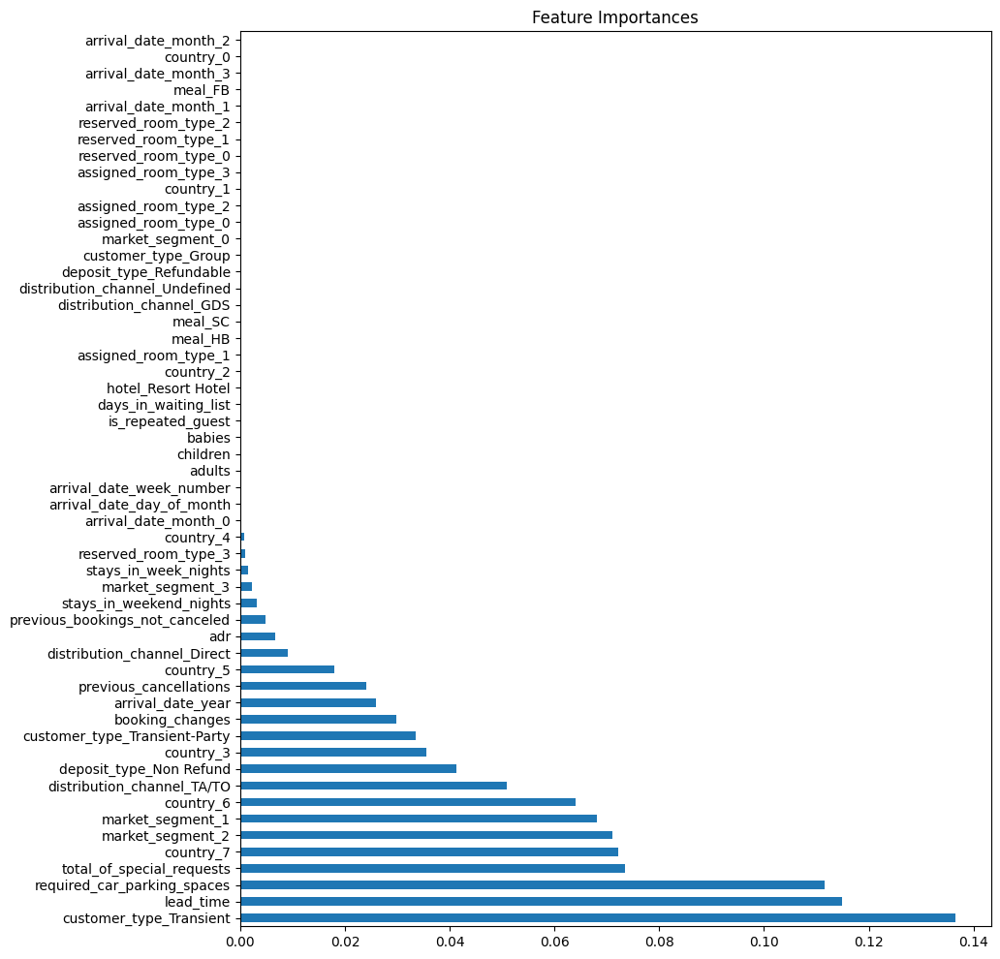

In [95]:
import pandas as pd
import matplotlib.pyplot as plt

# Get the feature importances and sort them
importances = best_model['algo'].feature_importances_
feature_names = []

# Retrieve feature names from the transformed columns
for transformer in transformer.transformers_:
    if hasattr(transformer[1], 'get_feature_names_out'):
        feature_names.extend(transformer[1].get_feature_names_out())
    else:
        # If the transformer doesn't have 'get_feature_names_out', use the original column names
        feature_names.extend(transformer[2])

# Create a pandas Series with feature importances and corresponding feature names
coef1 = pd.Series(importances, feature_names).sort_values(ascending=False)

# Plot the feature importances
plt.figure(figsize=(10,12))
coef1.plot(kind='barh', title='Feature Importances')
plt.show()


## CONFUSION MATRIX

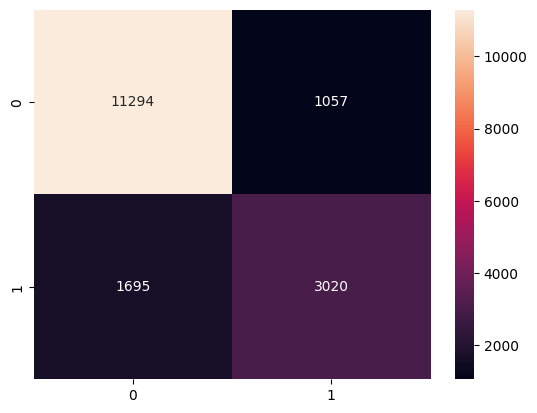

In [97]:
# Model sebelum tuning
sns.heatmap(confusion_matrix(y_test, y_pred_benchmark), annot=True, fmt='g');

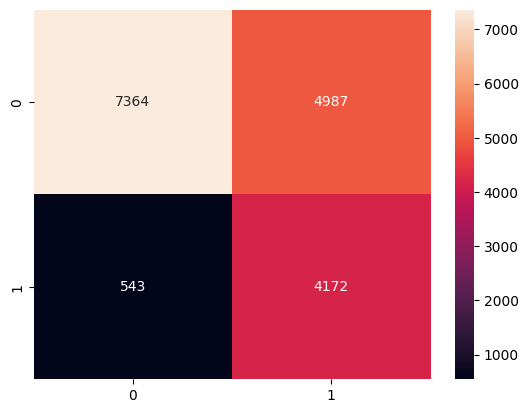

In [98]:
# Model setelah tuning
sns.heatmap(confusion_matrix(y_test, y_pred_randomizedsearch), annot=True, fmt='g');

In [99]:
print(classification_report(y_test, y_pred_randomizedsearch))

              precision    recall  f1-score   support

           0       0.93      0.60      0.73     12351
           1       0.46      0.88      0.60      4715

    accuracy                           0.68     17066
   macro avg       0.69      0.74      0.66     17066
weighted avg       0.80      0.68      0.69     17066



# KESIMPULAN DAN REKOMENDASI

Dalam model machine learning yang telah dibuat, kita berhasil mencapai skor recall sebesar 88% pada kelas 1 (pembatalan), yang berarti sebagian besar dari data yang sebenarnya mengalami pembatalan berhasil dideteksi oleh model. 

Sistem ini akan sangat membantu untuk mengidentifikasi calon penyewa saat musim ramai (peak season). Dengan demikian, pihak operasional hotel dapat memperoleh informasi yang akurat tentang 88% dari total calon penyewa yang sebenarnya akan membatalkan reservasinya. Dengan informasi ini, pihak hotel dapat melakukan konfirmasi lebih lanjut kepada calon penyewa apakah mereka akan melanjutkan pemesanannya atau tidak. Jika mereka berniat melanjutkan, pihak hotel dapat meminta mereka untuk membayar uang muka (DP) terlebih dahulu, sehingga kamar tidak akan dibatalkan secara tiba-tiba. 

Namun, untuk calon penyewa yang sebenarnya tidak akan membatalkan reservasi (kelas 0), model hanya berhasil mendeteksi sekitar 60% dari mereka. Hal ini wajar karena model lebih fokus pada pendeteksian calon penyewa yang berpotensi membatalkan reservasi.

Model machine learning ini memiliki sejumlah fitur, namun untuk menjaga model agar tidak terlalu kompleks, kita dapat memanfaatkan fitur importance untuk mengidentifikasi fitur-fitur yang memiliki kontribusi rendah terhadap prediksi model. Dengan cara ini, kita dapat menghapus fitur-fitur tersebut dan mengurangi kompleksitas model serta meningkatkan kecepatan pelatihan.

Sepuluh fitur teratas yang dianggap penting oleh model untuk membuat prediksi adalah sebagai berikut:
1. Tipe Pelanggan (Customer Type): Transient
2. Lead Time
3. Jumlah Tempat Parkir yang Dibutuhkan (Required Car Parking Spaces)
4. Total Permintaan Khusus (Total of Special Requests)
5. Negara (Country)
6. Segment Pasar (Market Segment)
7. Saluran Distribusi (Distribution Channel): TA/TO
8. Jenis Deposit (Deposit Type): Non Refund
9. Tipe Pelanggan (Customer Type): Transient Party
10. Perubahan Pemesanan (Booking Changes)

Rekomendasi saya adalah untuk lebih memfokuskan upaya dalam mengelola reservasi selama periode peak season, dengan berfokus pada calon penyewa yang berpotensi membatalkan. Selain itu, penting untuk mempertimbangkan penggunaan fitur-fitur yang teridentifikasi sebagai penting dalam model, dan memastikan bahwa sistem operasional hotel siap untuk mengambil tindakan yang sesuai berdasarkan prediksi model. Dengan pendekatan ini, hotel dapat mengoptimalkan pemesanan dan mengurangi risiko pembatalan yang tidak diinginkan.



**IMPLEMENTASI SISTEM KE DALAM STUDI KASUS**

Bila seandainya biaya untuk rata-rata 1 kamar hotel di portugal adalah 80$, dan andaikan jumlah reservasi sebanyak 2000 pemesan (dimana andaikan 1000 orang cancel, dan 1000 orang lagi tidak cancel), maka hitungannya kurang lebih akan seperti ini :

Tanpa Model (semua calon penyewa tidak diprediksi akan cancel atau tidak) :

-   Total Pemasukan => 1000 x 80 USD = 8000 USD
-   Biaya yang diterima=> 1000 x 80 USD = 8000 USD
-   Biaya yang terbuang => 1000 x 80 USD = 80000 USD (karena 1000 orang tidak bisa diprediksi akan cancel, dan kamar akan kosong)
-   Jumlah pemsukan tambahan => 0 USD

Dengan Model (calon penyewa yang diprediksi cancel akan diinformasikan untuk memberikan DP 50%) :

-   Total Pemasukan => (1000 x 80 USD) + (880 x 40 USD) = 80000 USD + 35200 USD = 115200 USD
-   Total Calon Penyewa yang diprediksi membatalkan reservasi => 880 orang (karena recall 1/yg tertarik itu 88%)
-   Total Calon penyewa yang salah diprediksi => 120 orang (karena recall 1/yg tertarik itu 12%)
-   Biaya yang terbuang => 400 x 80 USD = 32000 USD (berdasarkan recall 0/yg cancel (400 orang yang cancel))
-   Jumlah pemasukan tambahan => 880 x 40 USD(DP) = 35200 USD 

**REKOMENDASI dari model**

1. Lebih memfokuskan upaya dalam mengelola reservasi selama periode peak season, dengan berfokus pada calon penyewa yang berpotensi membatalkan.
2. Selain itu, penting untuk mempertimbangkan penggunaan fitur-fitur yang teridentifikasi sebagai penting dalam model, dan memastikan bahwa sistem operasional hotel siap untuk mengambil tindakan yang sesuai berdasarkan prediksi model. Dengan pendekatan ini, hotel dapat mengoptimalkan pemesanan dan mengurangi risiko pembatalan yang tidak diinginkan.


**Rekomendasi untuk target marketing**

Berdasarkan hasil analisis data reservasi hotel yang telah dilakukan, berikut adalah beberapa rekomendasi untuk manajemen hotel agar dapat meningkatkan kinerja dan kepuasan pelanggan:

1. **Mengelola Musim Liburan dengan Baik**: Mengingat puncak aktivitas reservasi terjadi pada bulan Mei dan Oktober, hotel dapat mempersiapkan diri dengan baik untuk menyambut tamu selama periode ini. Menyediakan fasilitas dan layanan ekstra selama musim liburan dapat meningkatkan kepuasan pelanggan.

2. **Manajemen Kebijakan Pembatalan**: Mengingat tingkat pembatalan yang signifikan pada tahun 2017, hotel dapat mempertimbangkan untuk meninjau kembali kebijakan pembatalan mereka. Mungkin ada cara untuk memberikan fleksibilitas lebih kepada tamu tanpa mengorbankan pendapatan.

3. **Promosi Hotel Kota**: Jika lebih banyak pemesanan terjadi di hotel kota, manajemen hotel kota dapat lebih fokus pada promosi dan pemasaran untuk menarik lebih banyak tamu. Menawarkan paket promosi yang menarik untuk pelancong kota dapat meningkatkan tingkat pemesanan.

4. **Manajemen Tipe Kamar**: Memantau penggunaan tipe kamar yang paling populer dan menyesuaikan inventarisasi kamar sesuai permintaan dapat membantu mengoptimalkan pendapatan dan efisiensi operasional.

5. **Paket Makanan**: Hotel dapat mempertimbangkan untuk mengembangkan dan mempromosikan paket makanan yang lebih fleksibel sesuai dengan preferensi pelanggan. Ini dapat mencakup pilihan makanan lebih ringan atau lebih berat, sesuai dengan kebutuhan pelanggan.

6. **Meningkatkan Layanan untuk Tamu Transient**: Karena pemesanan transient merupakan jenis pemesanan yang paling umum, hotel dapat memfokuskan upaya mereka pada meningkatkan layanan dan pengalaman untuk tamu transient. Ini dapat mencakup proses check-in/check-out yang lebih cepat dan pelayanan kamar yang efisien.

7. **Membangun Hubungan dengan Pelanggan Kontrak**: Hotel dapat memperkuat hubungan dengan pelanggan kontrak dengan menawarkan insentif dan fasilitas tambahan. Ini dapat mencakup diskon khusus atau pelayanan eksklusif.

8. **Manajemen Grup**: Dalam kategori pemesanan grup, perlu diperhatikan tingkat pembatalan yang tinggi. Hotel dapat berkomunikasi dengan baik dengan kelompok-kelompok ini untuk menghindari pembatalan massal. Pengaturan kebijakan khusus untuk kelompok juga dapat membantu mengurangi risiko pembatalan.


9. **Fokus pada Negara Teratas**: Menjaga hubungan baik dengan negara-negara teratas yang melakukan reservasi paling banyak, seperti Great Britain, France, Spain, Germany, Ireland, Italy, Belgium, Netherlands, dan USA, dapat membantu meningkatkan pangsa pasar dari negara-negara ini.




